### Training EfficientNet on sample of dataset 1 that was preprocesses using cropping the black outline + melanoma images augmentation (1:5) and test on 2019 year dataset.

In [ ]:
import os
import gdown
import shutil
import numpy as np
import pandas as pd
import pathlib
import matplotlib.pyplot as plt
from PIL import Image
import cv2
import tensorflow as tf
# import tensorflow_datasets as tfds
from tensorflow import keras
from tensorflow.keras import layers
from keras.models import Model
from tensorflow.keras.utils import save_img, img_to_array, array_to_img, load_img, image_dataset_from_directory
from tensorflow.keras.callbacks import ModelCheckpoint, EarlyStopping
# from tensorflow.keras.regularizers import l2
# from tensorflow.keras.metrics import Recall, Precision
from tensorflow.keras.utils import plot_model
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay

In [ ]:
from data_processing_utils import show_dirs_len, prepocess_to_crop, separate_vignette_images, crop_and_save

from models_processing_utils import make_sructured_subset, make_balanced_sructured_subset, make_custom_sructured_subset,\
                                    augment_and_save, run_augmentation, run_selective_augmentation, add_files, sample_and_copy_files,\
                                    generate_model_version_name, binary_class_weights, binary_class_weights_2, initial_bias_calc, initial_bias_calc_2,\
                                    MetricsLogger, CustomCheckpoint, plot_scores, plot_loss, plot_confusion_matrix, fbeta_metric,\
                                    make_model, get_predictions_df, get_predictions_df2, show_predicted,\
                                    ModelEvaluating, ModelPredicting, ModelTraining,\
                                    scan_dataset, preprocess_image, split_by_class, stratified_dataset_from_directory

## Формування робочого датасету

Завантаження джерела

In [ ]:
# https://drive.google.com/file/d/1Wn-z5ozhs94Pfgrix70CiCcQGZdTXh3z/view?usp=sharing
file_id = "1Wn-z5ozhs94Pfgrix70CiCcQGZdTXh3z"
url = f"https://drive.google.com/uc?id={file_id}"
output = "2020_supplemented_cropped.zip"

gdown.download(url, output, quiet=False)


Downloading...
From (original): https://drive.google.com/uc?id=1Wn-z5ozhs94Pfgrix70CiCcQGZdTXh3z
From (redirected): https://drive.google.com/uc?id=1Wn-z5ozhs94Pfgrix70CiCcQGZdTXh3z&confirm=t&uuid=74ad9bb4-6966-48e1-a6d1-176e1f4ca429
To: /content/2020_supplemented_cropped.zip
100%|██████████| 1.59G/1.59G [00:29<00:00, 53.8MB/s]


'2020_supplemented_cropped.zip'

In [ ]:
!unzip -q 2020_supplemented_cropped.zip

In [ ]:
os.makedirs('2020_supplemented_cropped', exist_ok=True)
!mv /content/content/2020_supplemented/* /content/2020_supplemented_cropped/

In [ ]:
show_dirs_len(pathlib.Path("/content/2020_supplemented_cropped"))

.: 2
test: 2
test/other: 10638
test/melanoma: 1587
train: 2
train/other: 32112
train/melanoma: 5093


In [ ]:
# shutil.rmtree("/content/2020_supplemented_cropped")
shutil.rmtree("/content/content")
# shutil.rmtree("/content/small_subset_cropped")

In [ ]:
data_dir = pathlib.Path("/content/2020_supplemented_cropped")

In [ ]:
# select in validation directory equal size of classes
val_dir = data_dir / "validation"
train_dir = data_dir / "train"
num_melanoma = len(os.listdir(os.path.join(train_dir, "melanoma")))
num_other = len(os.listdir(os.path.join(train_dir, "other")))
k = num_melanoma/num_other if num_other > 0 else 1
print(k)
rates_per_class = {
    "melanoma": 0.2,
    "other": 0.2*k
}
make_balanced_sructured_subset(train_dir, val_dir, 40, rates_per_class, copy=False)

0.15860114598903838


In [ ]:
show_dirs_len(data_dir)

.: 3
test: 2
test/other: 10638
test/melanoma: 1587
validation: 2
validation/other: 1018
validation/melanoma: 1018
train: 2
train/other: 31094
train/melanoma: 4075


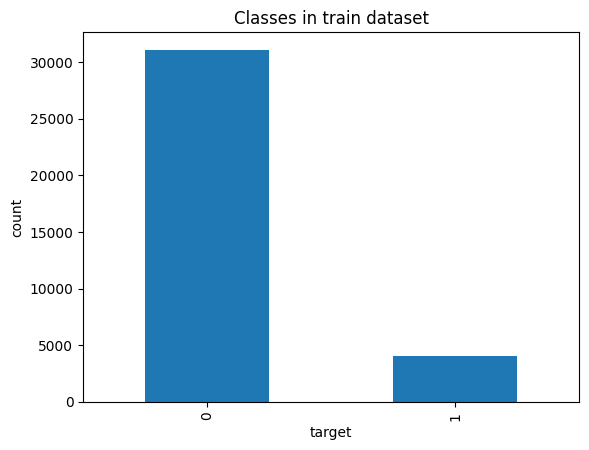

In [ ]:
tmp_df1 = pd.DataFrame({"image_name": os.listdir(data_dir / "train/melanoma"), "target": 1})
tmp_df2 = pd.DataFrame({"image_name": os.listdir(data_dir / "train/other"), "target": 0})
tmp_df_comb = pd.concat([tmp_df1, tmp_df2], ignore_index=True)
tmp_df_comb.target.value_counts().plot(kind='bar')
plt.title('Classes in train dataset')
plt.xlabel('target')
plt.ylabel('count')
plt.show()

### Функції для аугментації

In [ ]:
def augment_and_save(img_path, data_augmentation, num_aug, save=True, output_dir=None, add_func=None):
  aug_images_set =[]
  img = load_img(img_path) #завантажує зображення як PIL
  img_arr = img_to_array(img) #конвертує у NumPy
  img_arr = np.expand_dims(img_arr, axis=0)  # додати розмірність - batch
  for i in range(num_aug):
    augmented_img_arr = data_augmentation(img_arr, training=True)
    # augmented_img = keras.utils.array_to_img(augmented_img_arr[0])
    augmented_img = array_to_img(augmented_img_arr[0])   #first in batch
    if add_func is not None:
      augmented_img = add_func(augmented_img)
    aug_images_set.append(augmented_img)
    if save:
      os.makedirs(output_dir, exist_ok=True)
      img_name = os.path.basename(img_path)
      output_path = os.path.join(output_dir, f"{os.path.splitext(img_name)[0]}_aug_{i}.jpg")
      save_img(output_path, augmented_img)
  return aug_images_set

def run_augmentation(data_augmentation, input_dir, output_dir, num_aug, add_func=None):
  for img_name in os.listdir(input_dir):
    if img_name.endswith((".png", ".jpg", ".jpeg")):
      img_path = os.path.join(input_dir, img_name)
      augment_and_save(img_path, data_augmentation, num_aug, save=True, output_dir=output_dir, add_func=add_func)

def run_selective_augmentation(data_augmentation, input_dir, output_dir, num_aug, ratio=0.3, my_seed=42, add_func=None):
  """augmentation of subset"""
  np.random.seed(my_seed)
  images = os.listdir(input_dir)
  images_to_augm = np.random.choice(images, int(len(images)*ratio), replace=False)
  for img_name in images_to_augm:
    if img_name.endswith((".png", ".jpg", ".jpeg")):
      img_path = os.path.join(input_dir, img_name)
      augment_and_save(img_path, data_augmentation, num_aug, save=True, output_dir=output_dir, add_func=add_func)

In [ ]:
def add_files(source_dir, dest_dir):
  os.makedirs(dest_dir, exist_ok=True)
  for file_name in os.listdir(source_dir):
    source_file = os.path.join(source_dir, file_name)
    if os.path.isfile(source_file):
      destination_file = os.path.join(dest_dir, file_name)
      shutil.copyfile(source_file, destination_file)

## Створення вибірки з основного датасету для навчання на меншій кількості даних

In [ ]:
# select different proportion for train, valid and test datasets in small subset
subset_path = pathlib.Path("/content/small_subset_cropped")
rates_per_ds = {
    "train": 0.3,
    "validation": 1.0,
    "test": 0.7,
}
make_custom_sructured_subset(data_dir, subset_path, 10, rates_per_ds)

In [ ]:
show_dirs_len(subset_path)

.: 3
test: 2
test/other: 7446
test/melanoma: 1110
validation: 2
validation/other: 1018
validation/melanoma: 1018
train: 2
train/other: 9328
train/melanoma: 1222


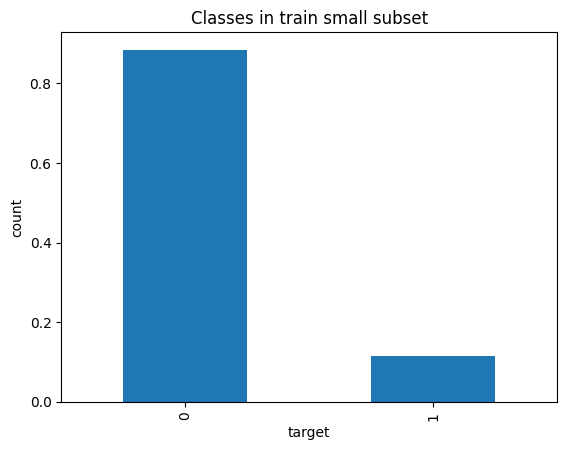

In [ ]:
tmp_df1 = pd.DataFrame({"image_name": os.listdir(subset_path / "train/melanoma"), "target": 1})
tmp_df2 = pd.DataFrame({"image_name": os.listdir(subset_path / "train/other"), "target": 0})
tmp_df_comb = pd.concat([tmp_df1, tmp_df2], ignore_index=True)
tmp_df_comb.target.value_counts(normalize=True).plot(kind='bar')
plt.title('Classes in train small subset')
plt.xlabel('target')
plt.ylabel('count')
plt.show()

## Аугментація цільового класу для збалансування набору

In [ ]:
data_augmentation = keras.Sequential(
    [ layers.RandomFlip(mode="horizontal_and_vertical"),
      layers.RandomRotation(0.5),
      layers.RandomZoom(0.3),
      layers.RandomShear(x_factor=0.2, y_factor=0.2, fill_mode="nearest"),
      # layers.MixUp(alpha=0.2),
      layers.RandomColorJitter(
          value_range=(0, 255),
          brightness_factor=0.1,
          contrast_factor=0.1,
          saturation_factor=(0.46, 0.54),
          hue_factor=0.05)
    ]
)

In [ ]:
# shutil.rmtree("/content/augmented")

In [ ]:
input_dir = pathlib.Path("/content/small_subset_cropped/train/melanoma")
output_dir = pathlib.Path("/content/augmented")

Аугментація зображень з тренувального набору (вибірка) для класу "меланома".

In [ ]:
np.random.seed(42)
augm_example = np.random.choice(os.listdir(input_dir), 1)[0]
augm_example_path = os.path.join(input_dir, augm_example)
augm_example_set = augment_and_save(augm_example_path, data_augmentation, 5, save=False)
augm_example_set = [Image.open(augm_example_path)] + augm_example_set

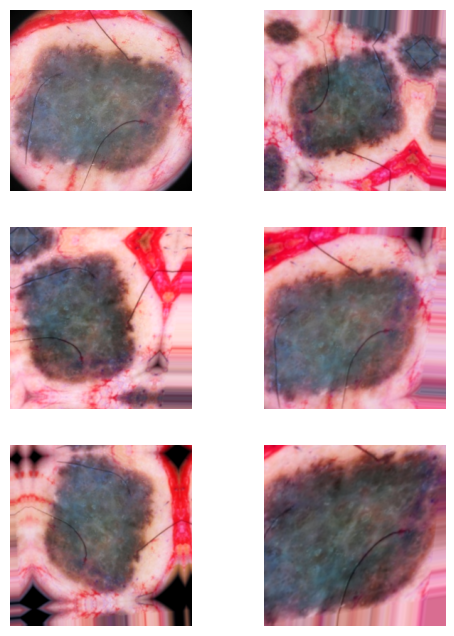

In [ ]:
plt.figure(figsize=(6, 8))
for i, image in enumerate(augm_example_set):
  ax = plt.subplot(3, 2, i + 1)
  plt.imshow(img_to_array(image).astype("uint8"))
  plt.axis("off")

In [ ]:
run_augmentation(data_augmentation, input_dir, output_dir, 5)

In [ ]:
show_dirs_len(output_dir)

.: 6110


In [ ]:
# зберегти за потреби аугментовані зображення
!zip -q -r 2020_train_melanoma_augmented_crsub5.zip . -i /augmented/*
from google.colab import files
files.download("2020_train_melanoma_augmented_crsub5.zip")

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [ ]:
# зберегти за потреби вибірку без аугментації
!zip -q -r small_subset_cropped.zip content/small_subset_cropped/
from google.colab import files
files.download("small_subset_cropped.zip")


zip error: Nothing to do! (try: zip -q -r 2020_small_subset.zip . -i ./content/small_subset/)


In [ ]:
# додати аугментовані файли у вибірку
add_files(output_dir, input_dir)

In [ ]:
show_dirs_len(input_dir)

.: 7332


In [ ]:
show_dirs_len(subset_path)

.: 3
test: 2
test/other: 7446
test/melanoma: 1110
validation: 2
validation/other: 1018
validation/melanoma: 1018
train: 2
train/other: 9328
train/melanoma: 7332


In [ ]:
# зберегти вибірку з аугментацією цільового класу
!zip -q -r small_subset_cropped_with_augm5.zip /content/small_subset_cropped
from google.colab import files
files.download("small_subset_cropped_with_augm5.zip")

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

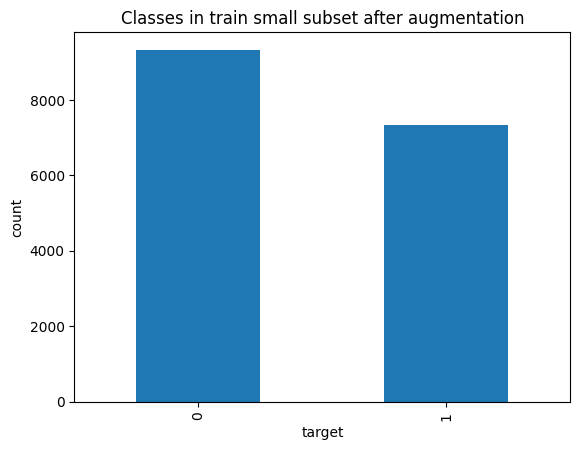

In [ ]:
tmp_df1 = pd.DataFrame({"image_name": os.listdir(subset_path / "train/melanoma"), "target": 1})
tmp_df2 = pd.DataFrame({"image_name": os.listdir(subset_path / "train/other"), "target": 0})
tmp_df_comb = pd.concat([tmp_df1, tmp_df2], ignore_index=True)
tmp_df_comb.target.value_counts().plot(kind='bar')
plt.title('Classes in train small subset after augmentation')
plt.xlabel('target')
plt.ylabel('count')
plt.show()

## Завантаження даних для навчання

In [ ]:
# датасет з аугментацією 1:5
# https://drive.google.com/file/d/1nka2rZtuipgEWHlUdesec1nLSWarMY-3/view?usp=sharing
file_id = "1nka2rZtuipgEWHlUdesec1nLSWarMY-3"
url = f"https://drive.google.com/uc?id={file_id}"
output = "small_subset_cropped_with_augm5.zip"

gdown.download(url, output, quiet=False)

Downloading...
From (original): https://drive.google.com/uc?id=1nka2rZtuipgEWHlUdesec1nLSWarMY-3
From (redirected): https://drive.google.com/uc?id=1nka2rZtuipgEWHlUdesec1nLSWarMY-3&confirm=t&uuid=d38aefa4-d801-41cd-a878-14c39e31e6b3
To: /content/small_subset_cropped_with_augm5.zip
100%|██████████| 911M/911M [00:13<00:00, 67.1MB/s]


'small_subset_cropped_with_augm5.zip'

In [ ]:
!unzip -q small_subset_cropped_with_augm5.zip

In [ ]:
small_data_dir = pathlib.Path("/content/small_subset_cropped")
show_dirs_len(small_data_dir)

.: 3
train: 2
train/other: 9328
train/melanoma: 7332
test: 2
test/other: 7446
test/melanoma: 1110
validation: 2
validation/other: 1018
validation/melanoma: 1018


In [ ]:
# small_data_dir =  pathlib.Path("/Source/content/small_subset")
# show_dirs_len(small_data_dir)

.: 3
test: 2
test\melanoma: 1110
test\other: 7446
train: 2
train\melanoma: 6110
train\other: 9328
validation: 2
validation\melanoma: 1018
validation\other: 1018


In [ ]:
# small_data_dir

WindowsPath('C:/Users/11/Desktop/1UNIVER/Diploma/Source/content/small_subset')

## Визначення параметрів, функцій для побудови моделі

In [ ]:
# IM_SIZE = 256
BATCH_SIZE = 32
METRICS = [
      keras.metrics.BinaryAccuracy(name='accuracy'),
      keras.metrics.Precision(name='precision'),
      keras.metrics.Recall(name='recall'),
      keras.metrics.TruePositives(name='tp'),
      keras.metrics.FalsePositives(name='fp'),
      keras.metrics.TrueNegatives(name='tn'),
      keras.metrics.FalseNegatives(name='fn'),
      keras.metrics.AUC(name='auc'),
      keras.metrics.AUC(name='prc', curve='PR') # precision-recall curve
]
VERSION = generate_model_version_name()
# MODEL_NAME = f"Basic_model_{VERSION}"
LEARNING_RATE = 1e-4

In [ ]:
VERSION

'04-21-06'

### Сворення об'єктів tf.Dataset

In [ ]:
train_ds = tf.keras.utils.image_dataset_from_directory(
  small_data_dir / "train",
  class_names=["other", "melanoma"],
  seed=123,
  # image_size=(IM_SIZE, IM_SIZE),
  shuffle=True,
  batch_size=BATCH_SIZE)

val_ds = tf.keras.utils.image_dataset_from_directory(
  small_data_dir / "validation",
  class_names=["other", "melanoma"],
  seed=123,
  # image_size=(IM_SIZE, IM_SIZE),
  batch_size=BATCH_SIZE)

test_ds = tf.keras.utils.image_dataset_from_directory(
  small_data_dir / "test",
  class_names=["other", "melanoma"],
  seed=123,
  # image_size=(IM_SIZE, IM_SIZE),
  batch_size=BATCH_SIZE)

Found 16660 files belonging to 2 classes.
Found 2036 files belonging to 2 classes.
Found 8556 files belonging to 2 classes.


### Візуалізація датасету

In [ ]:
class_names = train_ds.class_names
print(class_names)

['other', 'melanoma']


In [ ]:
print(train_ds)
print(val_ds)
print(test_ds)

<_PrefetchDataset element_spec=(TensorSpec(shape=(None, 256, 256, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None,), dtype=tf.int32, name=None))>
<_PrefetchDataset element_spec=(TensorSpec(shape=(None, 256, 256, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None,), dtype=tf.int32, name=None))>
<_PrefetchDataset element_spec=(TensorSpec(shape=(None, 256, 256, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None,), dtype=tf.int32, name=None))>


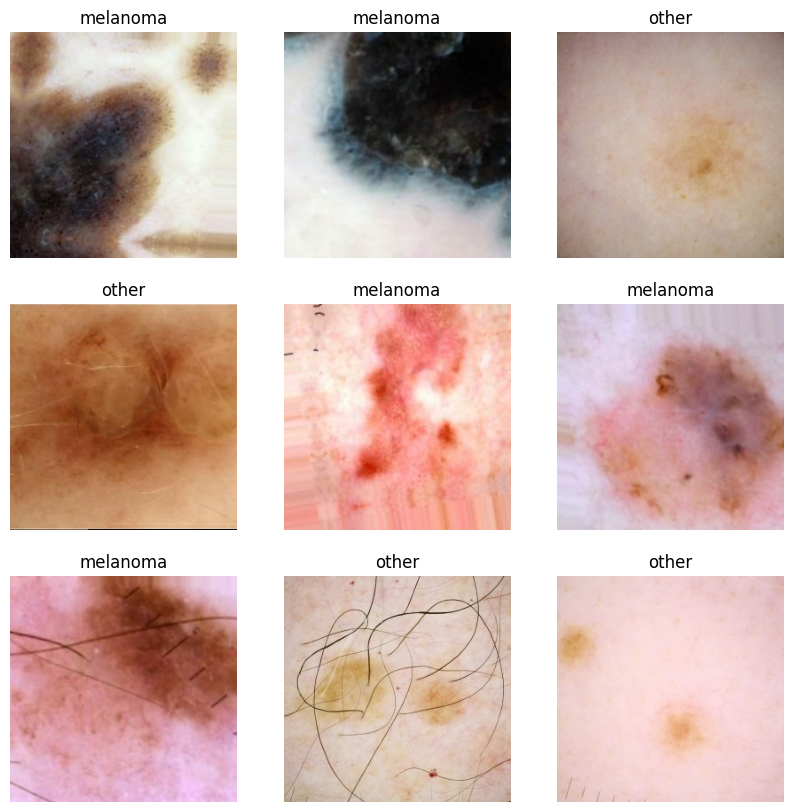

In [ ]:
plt.figure(figsize=(10, 10))
for images, labels in train_ds.take(1):
  for i in range(9):
    ax = plt.subplot(3, 3, i + 1)
    plt.imshow(images[i].numpy().astype("uint8"))
    plt.title(class_names[labels[i]])
    plt.axis("off")

### передобробка датасету

In [ ]:
# Configure the dataset for performance
train_ds = train_ds.shuffle(64).prefetch(buffer_size=tf.data.AUTOTUNE)
val_ds = val_ds.cache().prefetch(buffer_size=tf.data.AUTOTUNE)
test_ds = test_ds.prefetch(buffer_size=tf.data.AUTOTUNE)

### при дисбалансі класів

In [ ]:
count_1 = len(os.listdir(small_data_dir / "train/melanoma"))
count_0 = len(os.listdir(small_data_dir / "train/other"))

In [ ]:
# weight_0, weight_1 = binary_class_weights(train_ds)
weight_0, weight_1 = binary_class_weights_2(count_1, count_0)

class_weights = {0: weight_0, 1: weight_1}

print(f'Weight for class 0: {weight_0:.2f}')
print(f'Weight for class 1: {weight_1:.2f}')

Weight for class 0: 0.89
Weight for class 1: 1.14


In [ ]:
# initial_bias = initial_bias_calc(train_ds)
initial_bias = initial_bias_calc_2(count_1, count_0)
print(f'initial_bias: {initial_bias}')

initial_bias: -0.24077229963067803


### Модель

In [ ]:
# створення та компіляція моделі з заданим bias для останнього шару
def make_model(learning_rate=1e-3, metrics=METRICS, model=None, output_bias=None):
  model.compile(
      optimizer=keras.optimizers.Adam(learning_rate=learning_rate),
      loss=keras.losses.BinaryCrossentropy(),
      metrics=metrics)
  if output_bias is not None:
    model.layers[-1].bias.assign([output_bias])
  return model

In [ ]:
MODEL_NAMES = [f"MobileNetV2_{VERSION}",
              f"Xception_{VERSION}",
              f"ResNet50V2_{VERSION}",
              f"InceptionV3_{VERSION}",
               f"ConvNeXtTiny_{VERSION}",
               f"DenseNet121_{VERSION}",
               f"NASNetMobile_{VERSION}",
               f"EfficientNetV2B0_{VERSION}"]

In [ ]:
# ! Перезапускати
model_index = 7
MODEL_NAME = MODEL_NAMES[model_index]

In [ ]:
MODEL_NAME

'EfficientNetV2B0_04-21-06'

In [ ]:
if model_index == 0:
  from keras.applications.mobilenet_v2 import MobileNetV2, preprocess_input
  IM_SIZE = 256       #224
  base_model = MobileNetV2(
    weights="imagenet",
    input_shape=(IM_SIZE, IM_SIZE, 3),
    include_top=False)

if model_index == 1:
  from keras.applications.xception import Xception, preprocess_input
  IM_SIZE = 256   #229
  base_model = Xception(
    weights="imagenet",
    input_shape=(IM_SIZE, IM_SIZE, 3),
    include_top=False)

if model_index == 2:
  from keras.applications.resnet_v2 import ResNet50V2, preprocess_input
  IM_SIZE = 256   #224
  base_model = ResNet50V2(
    weights="imagenet",
    input_shape=(IM_SIZE, IM_SIZE, 3),
    include_top=False)

if model_index == 3:
  from keras.applications.inception_v3 import InceptionV3, preprocess_input
  IM_SIZE = 256   #229
  base_model = InceptionV3(
    weights="imagenet",
    input_shape=(IM_SIZE, IM_SIZE, 3),
    include_top=False)

if model_index == 4:
  from keras.applications.convnext import ConvNeXtTiny, preprocess_input
  IM_SIZE = 256
  base_model = ConvNeXtTiny(
    weights="imagenet",
    input_shape=(IM_SIZE, IM_SIZE, 3),
    include_top=False)

if model_index == 5:
  from keras.applications.densenet import DenseNet121, preprocess_input
  IM_SIZE = 256   #224
  base_model = DenseNet121(
    weights="imagenet",
    input_shape=(IM_SIZE, IM_SIZE, 3),
    include_top=False)

if model_index == 6:
  from keras.applications.nasnet import NASNetMobile, preprocess_input
  IM_SIZE = 256    #224
  base_model = NASNetMobile(
    weights="imagenet",
    input_shape=(IM_SIZE, IM_SIZE, 3),
    include_top=False)

if model_index == 7:
  from keras.applications.efficientnet_v2 import EfficientNetV2B0, preprocess_input
  IM_SIZE = 256
  base_model = EfficientNetV2B0(
    weights="imagenet",
    input_shape=(IM_SIZE, IM_SIZE, 3),
    include_top=False)

print(base_model.output_shape)

# preprocess for fine_tuning:
def preprocess(image, label):
  image = preprocess_input(image)
  return image, label

24274472/24274472 ━━━━━━━━━━━━━━━━━━━━ 0s 0us/step
(None, 8, 8, 1280)


In [ ]:
# заморозити шари базової моделі
base_model.trainable = False

In [ ]:
# train_ds = train_ds.map(preprocess)
# val_ds = val_ds.map(preprocess)
# test_ds = test_ds.map(preprocess)

In [ ]:
# модель
inputs = keras.Input(shape=(IM_SIZE, IM_SIZE, 3))
preprocessed = layers.Lambda(preprocess_input)(inputs)
x = base_model(preprocessed, training=False)  #to keep batchnorm layers in inference mode, when unfreeze the base model for fine-tuning
x = keras.layers.GlobalAveragePooling2D()(x)
x = keras.layers.Dropout(0.5)(x)
x = keras.layers.Dense(128, activation='relu', name="full_con1")(x)
outputs = keras.layers.Dense(1, activation='sigmoid', name="pred")(x)
model = keras.Model(inputs, outputs)

# EfficientNetV2B0

### Transfer learning

In [ ]:
labels = ['tl-', 'ft-']
label = labels[0]
print(label, MODEL_NAME)

# створення та компіляція transfer learning моделі
tl_model = make_model(metrics=METRICS, model=model, output_bias=initial_bias)
model.summary(show_trainable=True)

tl- EfficientNetV2B0_04-21-06


Model: "functional"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━┓
┃ Layer (type)                ┃ Output Shape          ┃    Param # ┃ Trai… ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━┩
│ input_layer_1 (InputLayer)  │ (None, 256, 256, 3)   │          0 │   -   │
├─────────────────────────────┼───────────────────────┼────────────┼───────┤
│ lambda (Lambda)             │ (None, 256, 256, 3)   │          0 │   -   │
├─────────────────────────────┼───────────────────────┼────────────┼───────┤
│ efficientnetv2-b0           │ (None, 8, 8, 1280)    │  5,919,312 │   N   │
│ (Functional)                │                       │            │       │
├─────────────────────────────┼───────────────────────┼────────────┼───────┤
│ global_average_pooling2d    │ (None, 1280)          │          0 │   -   │
│ (GlobalAveragePooling2D)    │                       │            │       │
├─────────────────────────────┼───────────────────────┼────────────┼───────┤
│ dropout (Dropout)           │ (None, 1280)          │          0 │   -   │
├─────────────────────────────┼───────────────────────┼────────────┼───────┤
│ full_con1 (Dense)           │ (None, 128)           │    163,968 │   Y   │
├─────────────────────────────┼───────────────────────┼────────────┼───────┤
│ pred (Dense)                │ (None, 1)             │        129 │   Y   │
└─────────────────────────────┴───────────────────────┴────────────┴───────┘

 Total params: 6,083,409 (23.21 MB)

 Trainable params: 164,097 (641.00 KB)

 Non-trainable params: 5,919,312 (22.58 MB)

In [ ]:
metrics_logger = MetricsLogger(filepath=f"metrics_logs_{label}{MODEL_NAME}.csv")

callbacks_list = [EarlyStopping(monitor='val_accuracy', patience=6),
                  ModelCheckpoint(f'small-{label}{MODEL_NAME}.keras', monitor='val_loss', save_best_only=True),
                  metrics_logger,
                  # WandbMetricsLogger(),
                  # WandbModelCheckpoint(filepath=f"small-{label}{MODEL_NAME}_wandb.keras", monitor="val_loss")
]

epochs=20

In [ ]:
# EfficientNetV2B0
history = tl_model.fit(
  train_ds,
  validation_data=val_ds,
  epochs=epochs,
  callbacks=callbacks_list,
  class_weight=class_weights
)

Epoch 1/20
521/521 ━━━━━━━━━━━━━━━━━━━━ 90s 97ms/step - accuracy: 0.9361 - auc: 0.9779 - fn: 274.7299 - fp: 191.2701 - loss: 0.1722 - prc: 0.9774 - precision: 0.9354 - recall: 0.9184 - tn: 4502.6128 - tp: 3398.1763 - val_accuracy: 0.8482 - val_auc: 0.9557 - val_fn: 294.0000 - val_fp: 15.0000 - val_loss: 0.3384 - val_prc: 0.9630 - val_precision: 0.9797 - val_recall: 0.7112 - val_tn: 1003.0000 - val_tp: 724.0000
Epoch 2/20
521/521 ━━━━━━━━━━━━━━━━━━━━ 25s 44ms/step - accuracy: 0.9580 - auc: 0.9879 - fn: 226.2950 - fp: 126.8065 - loss: 0.1206 - prc: 0.9884 - precision: 0.9633 - recall: 0.9390 - tn: 4574.6782 - tp: 3440.0901 - val_accuracy: 0.8119 - val_auc: 0.9664 - val_fn: 378.0000 - val_fp: 5.0000 - val_loss: 0.4485 - val_prc: 0.9709 - val_precision: 0.9922 - val_recall: 0.6287 - val_tn: 1013.0000 - val_tp: 640.0000
Epoch 3/20
521/521 ━━━━━━━━━━━━━━━━━━━━ 24s 45ms/step - accuracy: 0.9657 - auc: 0.9908 - fn: 202.8736 - fp: 87.0996 - loss: 0.1031 - prc: 0.9911 - precision: 0.9750 - recall

In [ ]:
from google.colab import files

df_basic = pd.DataFrame(history.history)
df_basic.to_csv(f"metrics_{label}{MODEL_NAME}.csv", index=False)

files.download(f'/content/metrics_logs_{label}{MODEL_NAME}.csv')
files.download(f'/content/small-{label}{MODEL_NAME}.keras')
files.download(f'/content/metrics_{label}{MODEL_NAME}.csv')

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

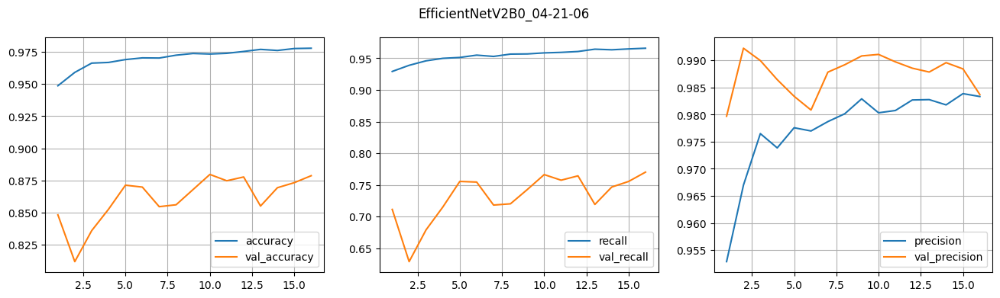

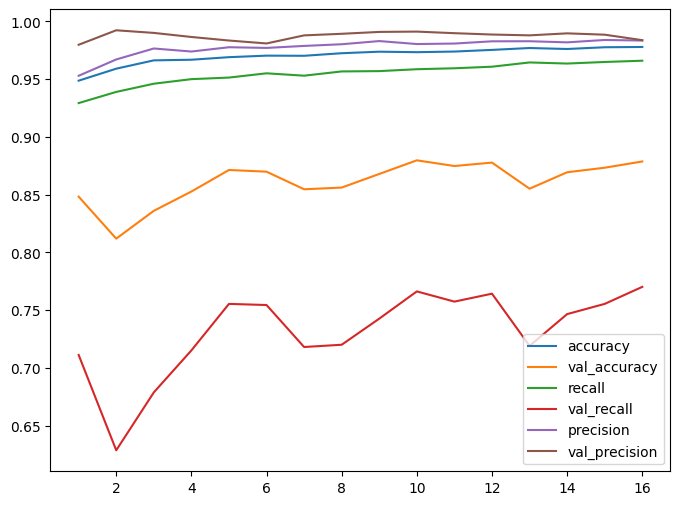

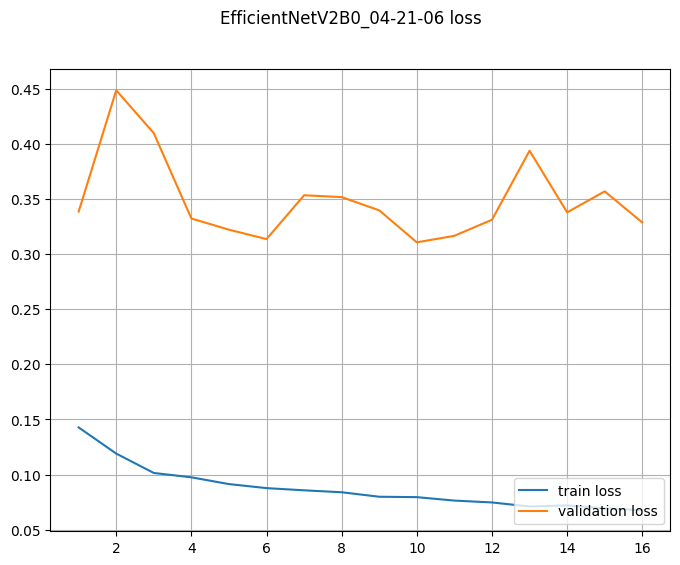

In [ ]:
plot_scores (df_basic, MODEL_NAME, ['accuracy', 'recall', 'precision'])
plot_loss(df_basic, MODEL_NAME)

In [ ]:
model_path = f"/content/small-tl-{MODEL_NAME}.keras"
best_tl_model = keras.models.load_model(model_path, custom_objects={"preprocess_input": preprocess_input})

best_tl_results = best_tl_model.evaluate(test_ds, verbose=1)

precision = best_tl_results[2]
recall = best_tl_results[3]
fbeta = fbeta_metric(precision, recall)
best_tl_results.append(fbeta)

268/268 ━━━━━━━━━━━━━━━━━━━━ 26s 73ms/step - accuracy: 0.9646 - auc: 0.9673 - fn: 118.7844 - fp: 37.2379 - loss: 0.1110 - prc: 0.9134 - precision: 0.9188 - recall: 0.7895 - tn: 3731.0557 - tp: 432.6543


In [ ]:
for metric, value in zip(["loss"] + [m.name for m in METRICS] + ["f1_beta"], best_tl_results):
  print(metric, ': ', value)
print()

loss :  0.11269115656614304
accuracy :  0.9636512398719788
precision :  0.9218584895133972
recall :  0.7864865064620972
tp :  873.0
fp :  74.0
tn :  7372.0
fn :  237.0
auc :  0.967245876789093
prc :  0.913023829460144
f1_beta :  0.8102840323384068



In [ ]:
# Зберегти результат оцінки на тествому наборі
df_eval = pd.DataFrame({'Metric': ["loss"] + [m.name for m in METRICS] + ["f1_beta"], 'Value': best_tl_results})
df_eval.to_csv(f'evaluate_results_{label}{MODEL_NAME}.csv', index=False)
files.download(f'/content/evaluate_results_{label}{MODEL_NAME}.csv')

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

### Fine tuning

ft- EfficientNetV2B0_04-21-06


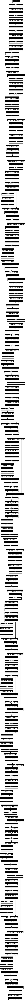

In [ ]:
labels = ['tl-', 'ft-']
label = labels[1]
print(label,  MODEL_NAME)

model_path = f"/content/small-tl-{MODEL_NAME}.keras"
best_tl_model = keras.models.load_model(model_path, custom_objects={"preprocess_input": preprocess_input})
# ! замінити назву шара:
base_model = best_tl_model.get_layer('efficientnetv2-b0')
plot_model(base_model, show_shapes=True)

In [ ]:
for layer in base_model.layers[-20:]:
  layer.trainable=True

for layer in base_model.layers[:-20]:
  layer.trainable=False

best_tl_model.summary(show_trainable=True)

Model: "functional"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━┓
┃ Layer (type)                ┃ Output Shape          ┃    Param # ┃ Trai… ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━┩
│ input_layer_1 (InputLayer)  │ (None, 256, 256, 3)   │          0 │   -   │
├─────────────────────────────┼───────────────────────┼────────────┼───────┤
│ lambda (Lambda)             │ (None, 256, 256, 3)   │          0 │   -   │
├─────────────────────────────┼───────────────────────┼────────────┼───────┤
│ efficientnetv2-b0           │ (None, 8, 8, 1280)    │  5,919,312 │   N   │
│ (Functional)                │                       │            │       │
├─────────────────────────────┼───────────────────────┼────────────┼───────┤
│ global_average_pooling2d    │ (None, 1280)          │          0 │   -   │
│ (GlobalAveragePooling2D)    │                       │            │       │
├─────────────────────────────┼───────────────────────┼────────────┼───────┤
│ dropout (Dropout)           │ (None, 1280)          │          0 │   -   │
├─────────────────────────────┼───────────────────────┼────────────┼───────┤
│ full_con1 (Dense)           │ (None, 128)           │    163,968 │   Y   │
├─────────────────────────────┼───────────────────────┼────────────┼───────┤
│ pred (Dense)                │ (None, 1)             │        129 │   Y   │
└─────────────────────────────┴───────────────────────┴────────────┴───────┘

 Total params: 6,411,605 (24.46 MB)

 Trainable params: 981,937 (3.75 MB)

 Non-trainable params: 5,101,472 (19.46 MB)

 Optimizer params: 328,196 (1.25 MB)

In [ ]:
metrics_logger = MetricsLogger(filepath=f"metrics_logs_{label}{MODEL_NAME}.csv")

best_tl_model.compile(
    optimizer=keras.optimizers.Adam(learning_rate=1e-5),
    loss=keras.losses.BinaryCrossentropy(),
    metrics=METRICS)

callbacks_list = [EarlyStopping(monitor='val_accuracy', patience=6),
                  ModelCheckpoint(f'small-{label}{MODEL_NAME}.keras', monitor='val_loss', save_best_only=True),
                  metrics_logger,
                  # WandbMetricsLogger(),
                  # WandbModelCheckpoint(filepath=f"small-{label}{MODEL_NAME}_wandb.keras", monitor="val_loss")
]

epochs=20

In [ ]:
# EfficientNetV2B0 fine tuning
history = best_tl_model.fit(
  train_ds,
  validation_data=val_ds,
  epochs=epochs,
  callbacks=callbacks_list,
  class_weight=class_weights
)

Epoch 1/20
521/521 ━━━━━━━━━━━━━━━━━━━━ 84s 98ms/step - accuracy: 0.9298 - auc: 0.9762 - fn: 420.0977 - fp: 247.5709 - loss: 0.1480 - prc: 0.9744 - precision: 0.9458 - recall: 0.8977 - tn: 5470.9062 - tp: 4264.5596 - val_accuracy: 0.8340 - val_auc: 0.9535 - val_fn: 331.0000 - val_fp: 7.0000 - val_loss: 0.4728 - val_prc: 0.9636 - val_precision: 0.9899 - val_recall: 0.6749 - val_tn: 1011.0000 - val_tp: 687.0000
Epoch 2/20
521/521 ━━━━━━━━━━━━━━━━━━━━ 28s 52ms/step - accuracy: 0.9609 - auc: 0.9893 - fn: 198.4483 - fp: 137.9176 - loss: 0.1178 - prc: 0.9882 - precision: 0.9623 - recall: 0.9479 - tn: 4551.8525 - tp: 3479.1687 - val_accuracy: 0.8433 - val_auc: 0.9595 - val_fn: 312.0000 - val_fp: 7.0000 - val_loss: 0.4319 - val_prc: 0.9677 - val_precision: 0.9902 - val_recall: 0.6935 - val_tn: 1011.0000 - val_tp: 706.0000
Epoch 3/20
521/521 ━━━━━━━━━━━━━━━━━━━━ 40s 50ms/step - accuracy: 0.9637 - auc: 0.9896 - fn: 202.7950 - fp: 104.7146 - loss: 0.1148 - prc: 0.9893 - precision: 0.9707 - recall

In [ ]:
# from google.colab import files

df_basic = pd.DataFrame(history.history)
df_basic.to_csv(f"metrics_{label}{MODEL_NAME}.csv", index=False)

files.download(f'/content/metrics_logs_{label}{MODEL_NAME}.csv')
files.download(f'/content/small-{label}{MODEL_NAME}.keras')
files.download(f'/content/metrics_{label}{MODEL_NAME}.csv')

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

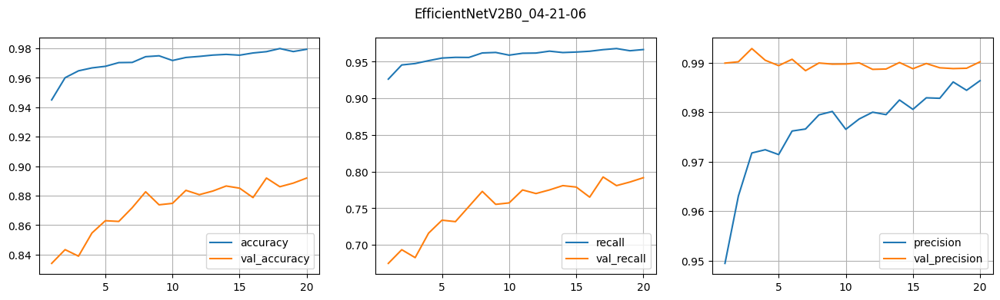

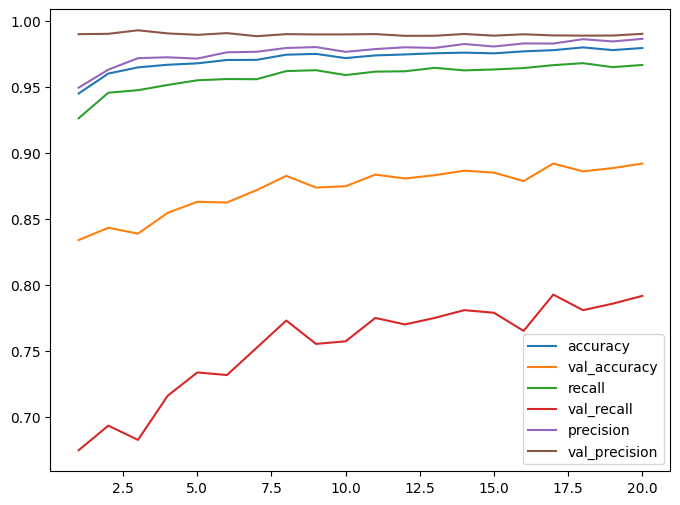

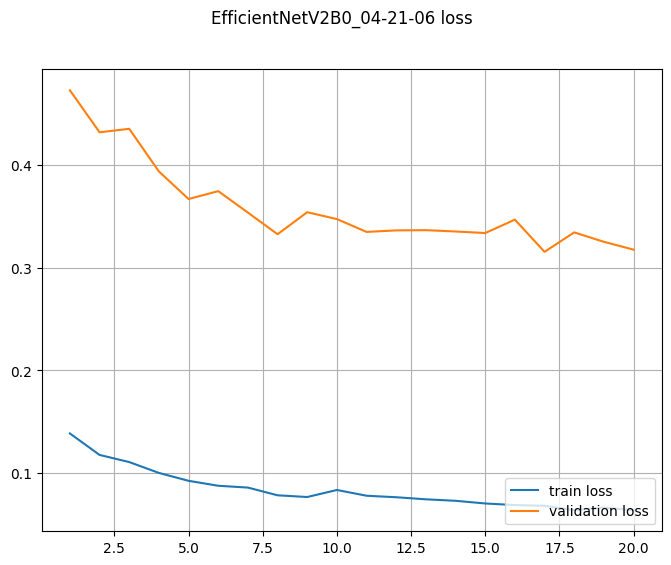

In [ ]:
plot_scores (df_basic, MODEL_NAME, ['accuracy', 'recall', 'precision'])
plot_loss(df_basic, MODEL_NAME)

In [ ]:
# load best model after fine tuning
model_path = f"/content/small-ft-{MODEL_NAME}.keras"
best_ft_model = keras.models.load_model(model_path, custom_objects={"preprocess_input": preprocess_input})

best_ft_results = best_ft_model.evaluate(test_ds, verbose=1)

precision = best_ft_results[2]
recall = best_ft_results[3]
fbeta = fbeta_metric(precision, recall)
best_ft_results.append(fbeta)

268/268 ━━━━━━━━━━━━━━━━━━━━ 26s 73ms/step - accuracy: 0.9672 - auc: 0.9715 - fn: 108.5130 - fp: 35.6022 - loss: 0.1019 - prc: 0.9234 - precision: 0.9247 - recall: 0.8082 - tn: 3732.5056 - tp: 443.1115


In [ ]:
for metric, value in zip(["loss"] + [m.name for m in METRICS] + ["f1_beta"], best_ft_results):
  print(metric, ': ', value)
print()

loss :  0.10418465733528137
accuracy :  0.9670406579971313
precision :  0.9294605851173401
recall :  0.8072072267532349
tp :  896.0
fp :  68.0
tn :  7378.0
fn :  214.0
auc :  0.9705561399459839
prc :  0.9220571517944336
f1_beta :  0.8290155612035753



In [ ]:
# Зберегти результат оцінки на тествому наборі
df_eval = pd.DataFrame({'Metric': ["loss"] + [m.name for m in METRICS] + ["f1_beta"], 'Value': best_ft_results})
df_eval.to_csv(f'evaluate_results_{label}{MODEL_NAME}.csv', index=False)
files.download(f'/content/evaluate_results_{label}{MODEL_NAME}.csv')

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

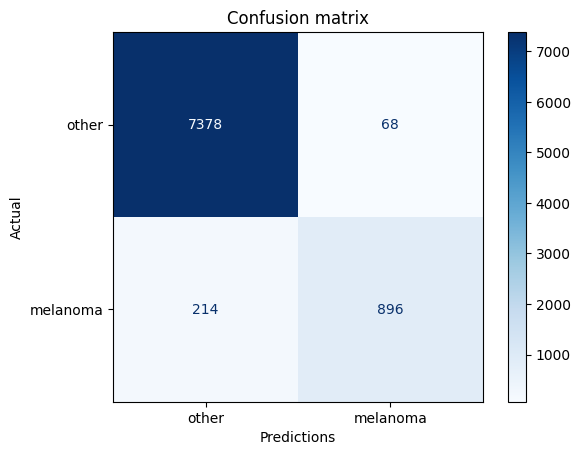

In [ ]:
predictions_array = []
test_labels_array = []
for images, labels in test_ds:
    predictions = best_ft_model.predict(images, verbose=0)
    predictions_array.extend(predictions)
    test_labels_array.extend(labels.numpy())
predictions_array = np.array(predictions_array)
test_labels_array = np.array(test_labels_array)

plot_confusion_matrix(test_labels_array, predictions_array, threshold=0.5)

In [ ]:
def get_predictions_df(model, img_size=(256, 256), batch_size=32, images_folder=None, dataset=None, threshold = 0.5):
  if images_folder is not None:
    dataset = tf.keras.utils.image_dataset_from_directory(
    images_folder,
    label_mode=None,
    image_size=img_size,
    batch_size=batch_size,
    shuffle=False
    )
  # get filenames, dataset.file_paths
  file_paths = dataset.file_paths

  predictions = model.predict(dataset, verbose=0)
  predicted_labels = (predictions >= threshold).astype(int)
  true_labels = [0 if 'other' in fp else 1 for fp in file_paths]

  predictions_df = pd.DataFrame({
      'file_path': file_paths,
      'true_label': true_labels,
      'predicted_label': np.concatenate(np.array(predicted_labels), axis=0),
      'predicted_prob': np.concatenate(np.array(predictions), axis=0)
  })
  return predictions_df

In [ ]:
def show_predicted(images_pathes):
  num = len(images_pathes)
  plt.figure(figsize=(16, np.ceil(num/5)*3.2))

  for i, im in enumerate(images_pathes):
    ax = plt.subplot(int(np.ceil(num/5)), 5, i + 1)
    image = Image.open(im)
    plt.imshow(img_to_array(image).astype("uint8"))
    plt.title(f"{predictions_df.file_path[predictions_df['file_path']==im].values[0][-16:]} ,\n, True: {predictions_df.true_label[predictions_df['file_path']==im].values[0]}, Predicted: {predictions_df.predicted_prob[predictions_df['file_path']==im].values[0]: .2f}")
    plt.axis("off")

In [ ]:
data_dir = pathlib.Path('/content/small_subset_cropped')
img_size = (256, 256)
batch_size = 32
# перевизначити, щоб прибрати prefetch та отримати атрибут датасету file_paths, а також прибрати мітки, перемішування
test_dataset = tf.keras.utils.image_dataset_from_directory(
  data_dir / "test",
  label_mode=None,
  image_size=img_size,
  batch_size=batch_size,
  shuffle=False)

Found 8556 files.


In [ ]:
from sklearn.metrics import classification_report, precision_recall_fscore_support

predictions_df = get_predictions_df(best_ft_model, img_size=img_size, batch_size=batch_size, dataset=test_dataset)
print(classification_report(predictions_df['true_label'], predictions_df['predicted_label']))
print(precision_recall_fscore_support(predictions_df['true_label'], predictions_df['predicted_label'], beta=2.0, average='weighted'))

predictions_df.to_csv(f'Predictions_{label}{MODEL_NAME}.csv', index=False)
from google.colab import files
files.download(f'Predictions_{label}{MODEL_NAME}.csv')

              precision    recall  f1-score   support

           0       0.97      0.99      0.98      7446
           1       0.93      0.81      0.86      1110

    accuracy                           0.97      8556
   macro avg       0.95      0.90      0.92      8556
weighted avg       0.97      0.97      0.97      8556

(0.9663179791291097, 0.9670406732117812, 0.9665015125509596, None)


In [ ]:
mask_fp = (predictions_df['true_label'] == 0) & (predictions_df['predicted_label'] == 1)
mask_fn = (predictions_df['true_label'] == 1) & (predictions_df['predicted_label'] == 0)
mask_tn = (predictions_df['true_label'] == 0) & (predictions_df['predicted_label'] == 0)
mask_tp = (predictions_df['true_label'] == 1) & (predictions_df['predicted_label'] == 1)
fp_images_pathes = predictions_df.file_path[mask_fp]
fn_images_pathes = predictions_df.file_path[mask_fn]
tp_images_pathes = predictions_df.file_path[mask_tp]
tn_images_pathes = predictions_df.file_path[mask_tn]
print(f'FP: {len(fp_images_pathes)}, FN: {len(fn_images_pathes)}')
print(f'TP: {len(tp_images_pathes)}, TN: {len(tn_images_pathes)}')

FP: 68, FN: 214
TP: 896, TN: 7378


False Negative:


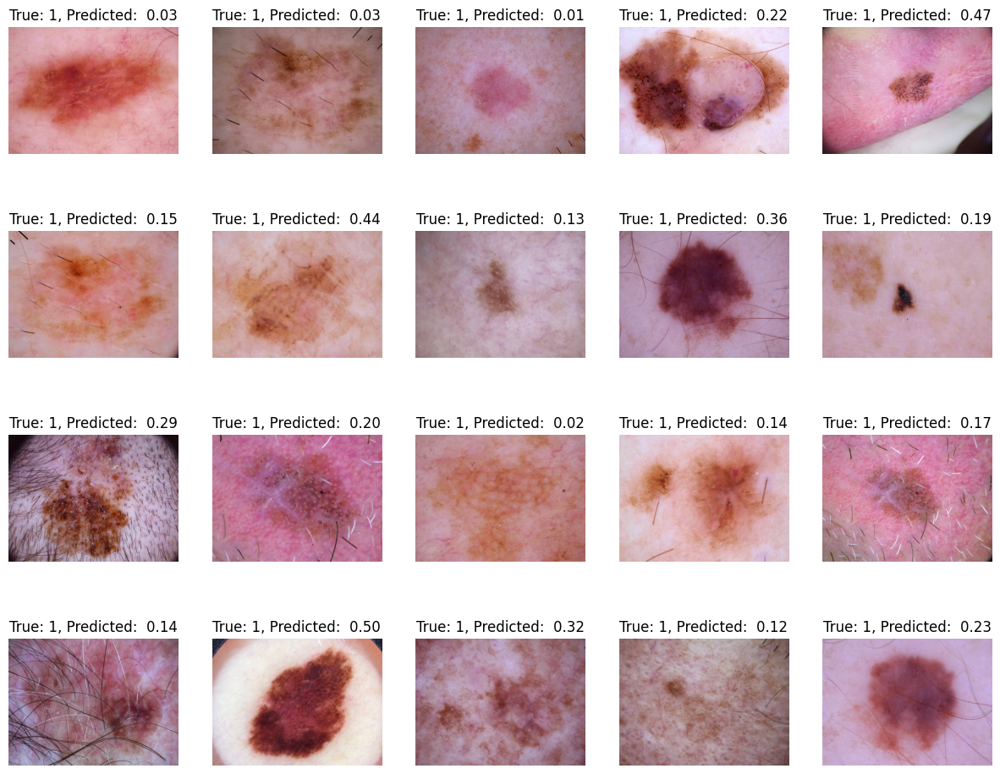

In [ ]:
# Візуалізація FN
print("False Negative:")
show_predicted(fn_images_pathes[:20])

False Positive:


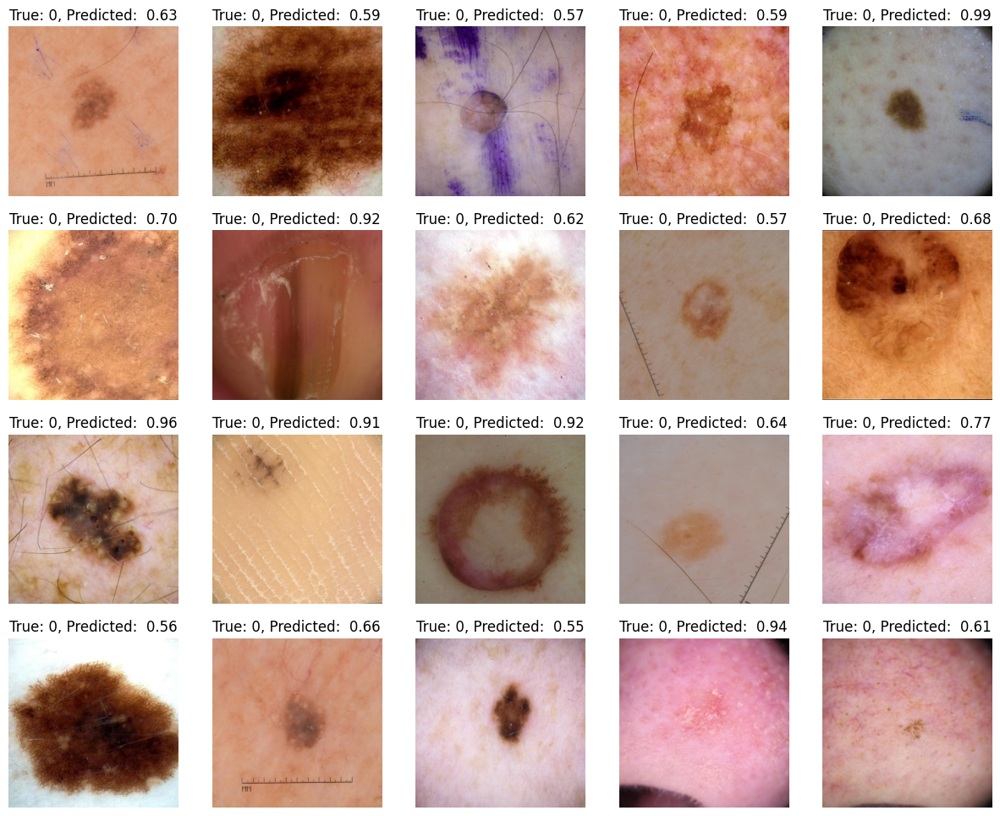

In [ ]:
# Візуалізація FP
print("False Positive:")
show_predicted(fp_images_pathes[:20])

Перевірка на тестових даних 2019 року

In [ ]:
# https://drive.google.com/file/d/1Mgs7tFfJIgsbtZhm38pZh6wmbxQzZNPV/view?usp=sharing
file_id = "1Mgs7tFfJIgsbtZhm38pZh6wmbxQzZNPV"
url = f"https://drive.google.com/uc?id={file_id}"
output = "2019test.zip"

gdown.download(url, output, quiet=False)

!unzip -q /content/2019test.zip

Downloading...
From (original): https://drive.google.com/uc?id=1Mgs7tFfJIgsbtZhm38pZh6wmbxQzZNPV
From (redirected): https://drive.google.com/uc?id=1Mgs7tFfJIgsbtZhm38pZh6wmbxQzZNPV&confirm=t&uuid=47d96eb8-e41b-426d-ada3-7dabb9389b3c
To: /content/2019test.zip
100%|██████████| 803M/803M [00:17<00:00, 46.0MB/s]


In [ ]:
data_dir = pathlib.Path('/content/2019 test')

test_dataset = tf.keras.utils.image_dataset_from_directory(
  data_dir,
  label_mode=None,
  image_size=img_size,
  batch_size=batch_size,
  shuffle=False)

predictions_df = get_predictions_df(best_ft_model, img_size=img_size, batch_size=batch_size, dataset=test_dataset)
print(classification_report(predictions_df['true_label'], predictions_df['predicted_label']))
print(precision_recall_fscore_support(predictions_df['true_label'], predictions_df['predicted_label'], beta=2.0, average='weighted'))

mask_fp = (predictions_df['true_label'] == 0) & (predictions_df['predicted_label'] == 1)
mask_fn = (predictions_df['true_label'] == 1) & (predictions_df['predicted_label'] == 0)
mask_tn = (predictions_df['true_label'] == 0) & (predictions_df['predicted_label'] == 0)
mask_tp = (predictions_df['true_label'] == 1) & (predictions_df['predicted_label'] == 1)
fp_images_pathes = predictions_df.file_path[mask_fp]
fn_images_pathes = predictions_df.file_path[mask_fn]
tp_images_pathes = predictions_df.file_path[mask_tp]
tn_images_pathes = predictions_df.file_path[mask_tn]
print(f'FP: {len(fp_images_pathes)}, FN: {len(fn_images_pathes)}')
print(f'TP: {len(tp_images_pathes)}, TN: {len(tn_images_pathes)}')

Found 8238 files.
              precision    recall  f1-score   support

           0       0.95      0.24      0.38      6911
           1       0.19      0.94      0.32      1327

    accuracy                           0.35      8238
   macro avg       0.57      0.59      0.35      8238
weighted avg       0.83      0.35      0.37      8238

(0.827553443943233, 0.3486283078417092, 0.31750605989780223, None)
FP: 5280, FN: 86
TP: 1241, TN: 1631


In [ ]:
fp_images_pathes.iloc[0]

'/content/2019 test/other/ISIC_0034321.jpg'

False Negative:


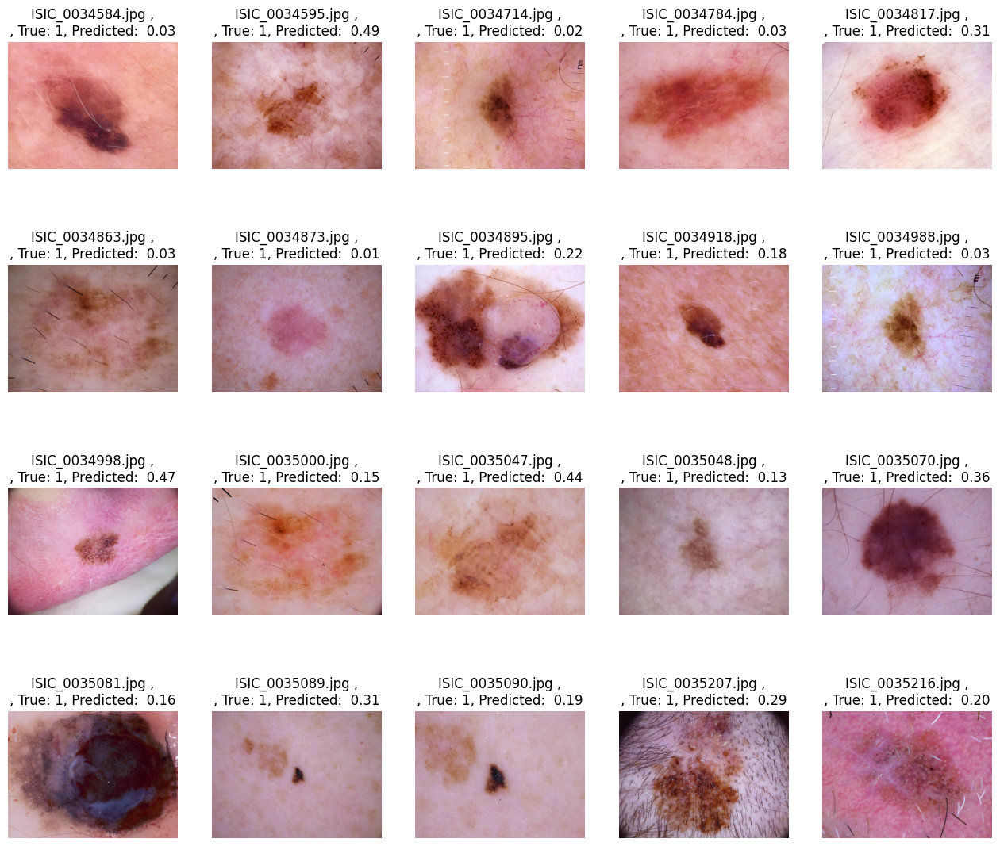

In [ ]:
# Візуалізація FP
print("False Negative:")
show_predicted(fn_images_pathes[:20])

False Positive:


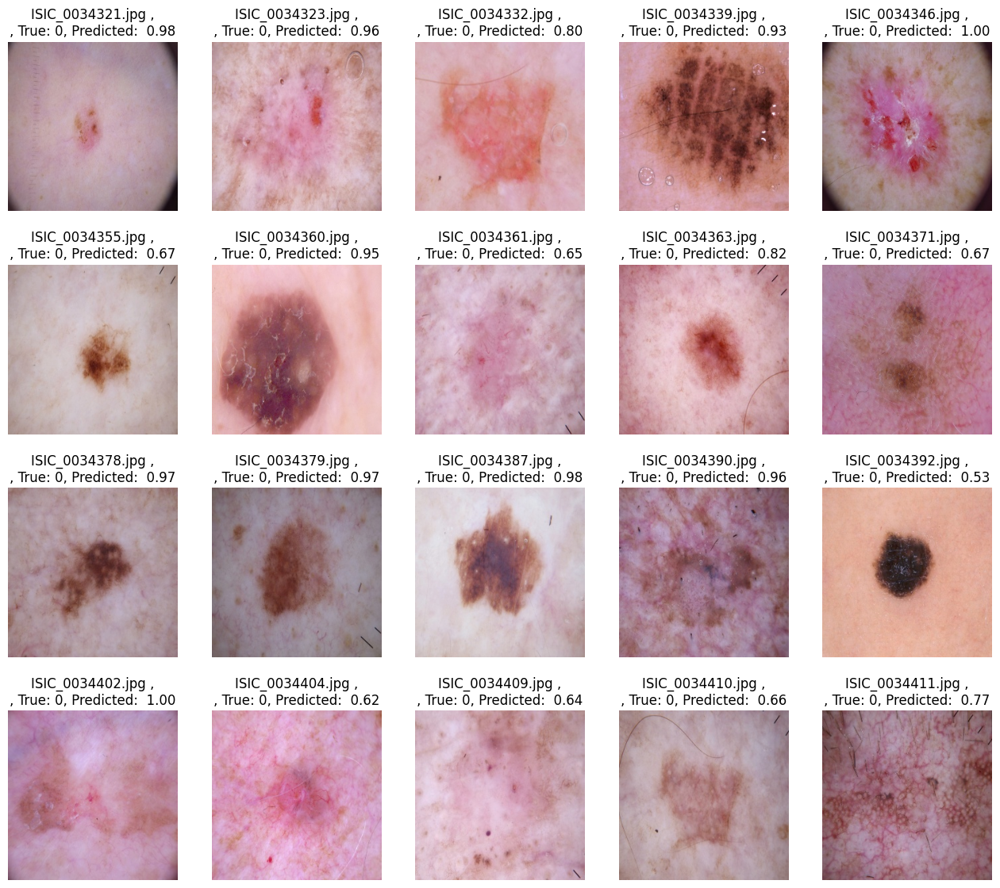

In [ ]:
# Візуалізація FP
print("False Positive:")
show_predicted(fp_images_pathes[:20])

Негативний клас погано визначається на тестових даних 2019року.